<a href="https://colab.research.google.com/github/dilya-a/machine-learning/blob/master/neural-networks/intro_to_tensorflow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dog Breed Identification Using Tensorflow 2.0 and Tensorflow Hub

This project is about using photos to identify 120 different dog breeds.
## Info about the project
### 1. Problem
Be able to identify 120 dog breeds from pictures.

### 2. Data
Data comes from Kaggle's competition at (https://www.kaggle.com/c/dog-breed-identification/overview).

### 3. Evaluation
The model is evaluated using multi class log loss. The submission file lists all dog breeds and the probability of the picture being each one of those breeds.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

### 4. Features

Some information about the data:
* Unstructured data (images) - use deep learning.
* 120 dog breeds
* 10,000+ images in training set
* 10,000+ images in test set

## 1. Get our workspace ready
* import TensorFlow 2.x
* import TensorFlow Hub
* make sure we're using a GPU

In [1]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Import TensorFlow 2.x, TensorFlow Hub, and check GPU availability
import tensorflow as tf
import tensorflow_hub as hub

print("TF version is:", tf.__version__)
print("TF Hub version:", hub.__version__)
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
TF version is: 2.2.0
TF Hub version: 0.8.0
GPU available


In [4]:
# Save the path as a variable
path = "drive/My Drive/machine-learning/dog-vision/"

**Use this code to unzip files**

`!unzip "drive/My Drive/machine-learning/dog-vision/dog-breed-identification.zip" -d "drive/My Drive/machine-learning/dog-vision"`

## 2. Get data ready
Getting data into the right format before modelling. In any machine learning project we need data to be in numerical format.

### 2.1 Loading data labels
Let's access data and checking the labels.

In [5]:
import pandas as pd
labels_csv = pd.read_csv(path+"labels.csv")
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     f184f4ea0aad4cac48670bede5868054  scottish_deerhound
freq                                   1                 126


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


Let's check how many images of each breed there are.

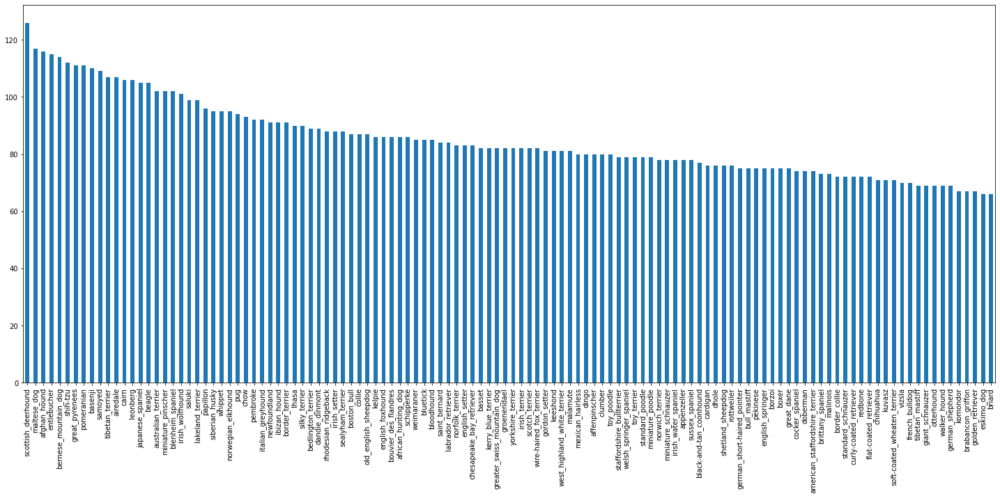

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(25, 10));

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

This is important to check because we want to make sure we have enough data for each label. It's ideal to aim for at least 100 samples per category, but a minimum of 10 is good. We have a median of 82 images for each dog breed.

Let's see an example image before proceeding.

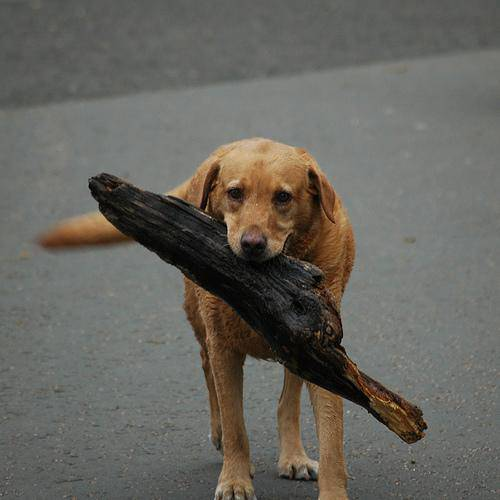

In [6]:
from IPython.display import Image
Image(path+"train/0021f9ceb3235effd7fcde7f7538ed62.jpg")

### 2.2 Getting image filenames into a list

In [8]:
filenames = [path+"train/" + fname + ".jpg" for fname in labels_csv["id"]]

filenames[:10]

['drive/My Drive/machine-learning/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/machine-learning/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/machine-learning/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/machine-learning/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/machine-learning/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/machine-learning/dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/machine-learning/dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/machine-learning/dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/machine-learning/dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/machine-learning/dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

Before we can go further, we need to check if the number of names actually matches the number of files we have.

In [9]:
import os
if len(os.listdir(path+"train/")) == len(filenames):
  print("Number of files and filenames matches.")
else:
  print("Number of files and filenames does NOT match.")

Number of files and filenames matches.


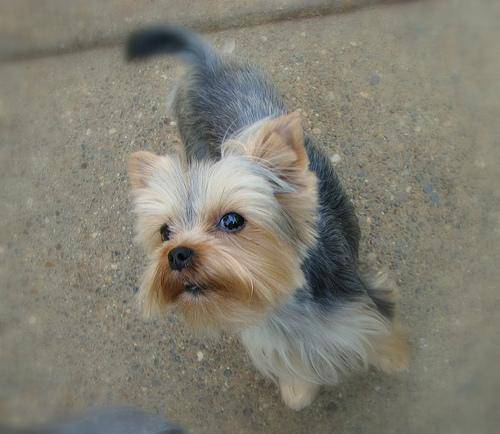

In [ ]:
# Check to see if we can see the images
Image(filenames[320])

### 2.3 Prepare the labels

In [10]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

Find unique label values and play around with data to make sure there are no missing values.

In [24]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

Now we can turn every label into an array of booleans, which in turn can be converted into categories.

In [ ]:
bool_labels = [label == unique_breeds for label in labels]
bool_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

Booleans are technically numerical values (True = 1, False = 0).

### 2.4 Creating a validation set

Since the Kaggle dataset doesn't have the validation set, we can make our own.

In [ ]:
# Set up X and y variables
X = filenames
y = bool_labels

Since there are 10,000+ images, we need to start working with a smaller size (~1000) so we can train and fine tune the model so it doesn't take too long to train them.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step: 500}

In [ ]:
# Split data into train and validation sets
from sklearn.model_selection import train_test_split

# Split
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
# Check the data
X_train[:2], y_train[:2]

(['drive/My Drive/machine-learning/dog-vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/machine-learning/dog-vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, Fa

### 2.5 Preprocessing Images (turn images into tensors)
We need to change the images into numbers so we can use models.
1. Take an image filepath as input
2. Use TensorFLow to read the file and save it to a variable `image`
3. Turn our `image` into Tensors
4. Resize the `image` to be a shape of (224, 224)
5. Return modified `image`

Before writing the function, let's see what importing an image looks like.

In [ ]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

The shape is describes as a 3D array, it's 257 pixels wide, 350 pixels high, and the 3 refers to the RGB combination needed to describe the color of the pixel.

In [ ]:
# Turn image into tensors
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

Tensors make it easier to run on a GPU, so it ends up being a lot faster.

Now let's write the funtion.

In [16]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):
    """
    Takes an image file path and turns the image into a Tensor. Write the full path.
    """
    # Read in an image file
    image = tf.io.read_file(image_path)
    # Turn the jpeg image into numerical Tensor with 3 color channels (Red, Green, Blue)
    image = tf.image.decode_jpeg(image, channels=3)
    # Convert the color channel values from 0-255 to 0-1 (normalize them)
    image = tf.image.convert_image_dtype(image, tf.float32)
    # Resize image
    image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

    return image

### 2.6 Turning data into batches
TensorFlow likes to use **batches** to analyze.

Why turn them into batches?

If we try to train everything at once, we might not have enough memory. That's why we use batch sizes of about 32 at a time.

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples: `(image, label)`.

In [15]:
# Create a function to return a tuple of Tensors
def get_image_label(image_path, label):
    """
    Takes an image file path and the label and returns a tuple of processed 
    and label.
    """
    image = process_image(image_path)
    return image, label

Now, we can write a function to turn all of the data (X and y) into batches. Training, validation, and test batches will be different.

In [14]:
# Define the batch size
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    """
    Creates batches of data out of image (X) and label (y) pairs.
    Shuffles the data if it's training data but doesn't shuffle if it's validation data.
    Also accepts test data as input (no labels).
    """
    # If the data is a test dataset, we don't have labels
    if test_data:
        print("Creating test data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
        data_batch = data.map(process_image).batch(batch_size)
        return data_batch

    # If the data is a validation set, we don't need to shuffle it
    elif valid_data:
        print("Creating validation batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                  tf.constant(y)))
        data_batch = data.map(get_image_label).batch(batch_size)
        return data_batch

    # Shuffle for the training data batches
    else:
        print("Creating training data batches...")
        # Turn filepaths and labels into Tensors
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                  tf.constant(y)))
        # Shuffling pathnames and labels before mapping image processor function is faster that shuffling images
        data = data.shuffle(buffer_size=len(X))
        # Create tuples
        data = data.map(get_image_label)
        # Create batches
        data_batch = data.batch(batch_size)
        return data_batch

In [ ]:
# Creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### 2.7 Visualizing data batches
Our data is now in batches, but they can be too difficult to make sense of, so we can write a function to show the images.

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
    """
    Displays a plot of 25 images and their labels from a data batch
    """
    # Set up the figure
    plt.figure(figsize=(15,15))

    # Loop through 25
    for i in range(25):
        # Create subplots
        ax = plt.subplot(5, 5, i+1)
        # Display image
        plt.imshow(images[i])
        # Add the image label as the title
        plt.title(unique_breeds[labels[i].argmax()])
        plt.axis('off')

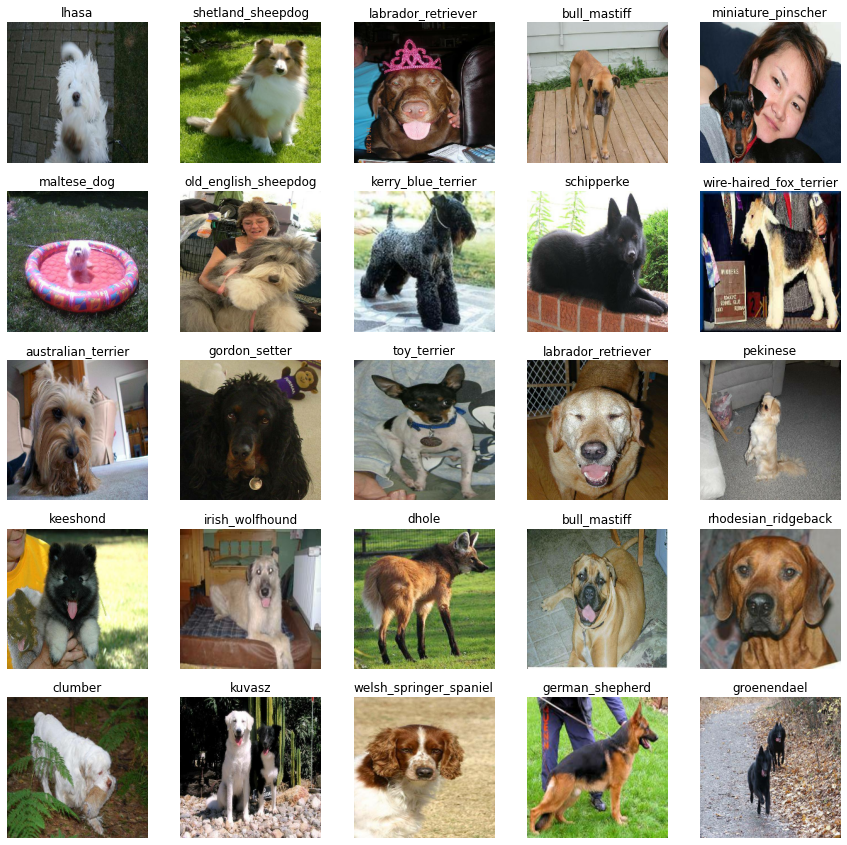

In [ ]:
# Let's visualize the data
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

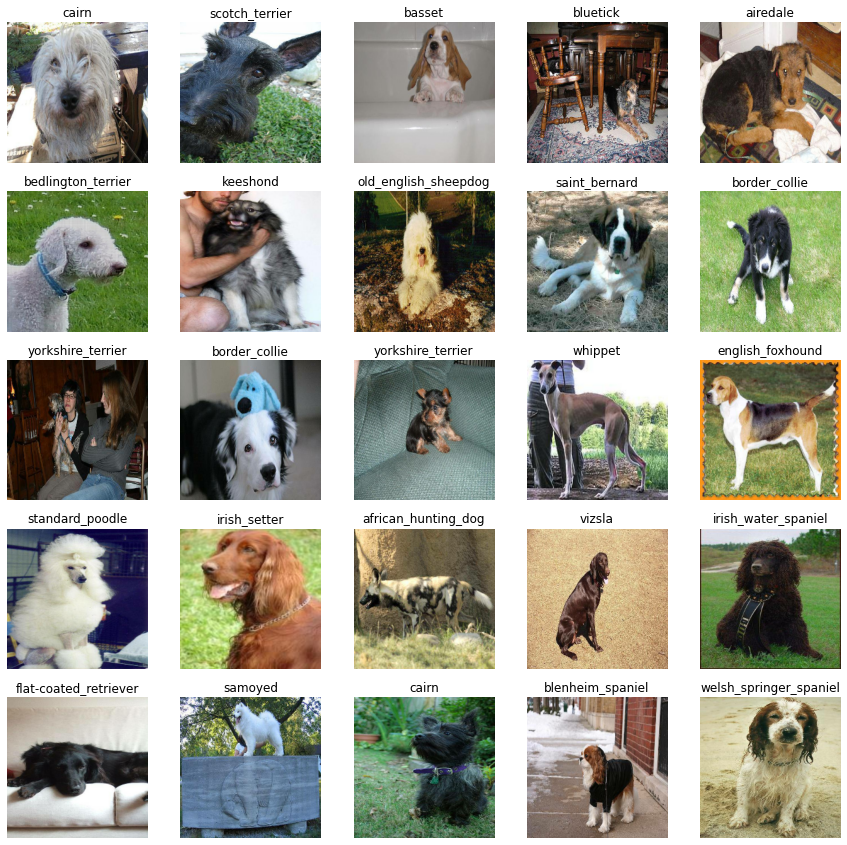

In [ ]:
# Visualize validation data
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## 3. Creating Models
Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model
* The output shape (image labels, in the form of Tensors) of our model
* The URL of the model we want to use

### 3.1 Prepare inputs and outputs

In [11]:
# Set up input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

# Set up output shape of the model
OUTPUT_SHAPE = len(unique_breeds)

# Set up model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

NameError: ignored

### 3.2 Building a model
Keras is a Python deep learning API. We will be using Keras sequential for this project.

Let's write a function which:
* Takes the input shape, output shape, and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion.
* Complies the model.
* Builds the model.
* Returns the model.

In [ ]:
# Create the function that builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    """
    Takes the input shape, output shape, and the model we've chosen as parameters.
    Defines the layers in a Keras model in sequential fashion.
    Complies the model.
    Builds the model.
    """
    print("Building model with:", model_url)

    # Set up the model layers
    model = tf.keras.Sequential([
        hub.KerasLayer(model_url),
        tf.keras.layers.Dense(units=output_shape, activation="softmax")
    ])

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    # Build the model
    model.build(input_shape)

    return model

In [ ]:
model = create_model()

model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     multiple                  5432713   
_________________________________________________________________
dense (Dense)                multiple                  120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


### 3.3 Creating callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

Two callbacks:
1. For TensorBoard which helps track our model's progress 
2. For early stopping which prevents our model from training for too long

In [ ]:
# Create the TensorBoard callback
%load_ext tensorboard

In [ ]:
import datetime

def create_tensorboard_callback():
    # Create a log directory for storing TensorBoard logs
    logdir = os.path.join(path + "logs", datetime.datetime.now().strftime("%Y%m%d - %H%M%S"))
    return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
# Create an early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## 4. Training a model
Our first model is only going to train on 1000 images, to make sure everything is working.

### 4.1 Write the function to train the model

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

Let's write a function that trains a model.

* Create a model using `create_model()`
* Set up a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [ ]:
# Write the function
def train_model():
    """
    Trains a given model and returns the trained version
    """
    # Create the model
    model = create_model()

    # Create new TensorBoard session 
    tensorboard = create_tensorboard_callback()

    #  Fit the model to the data passing it the callbacks we created
    model.fit(x=train_data,
              epochs=NUM_EPOCHS,
              validation_data=val_data,
              validation_freq=1,
              callbacks=[tensorboard, early_stopping])
    
    return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 551s 22s/step - loss: 4.5302 - accuracy: 0.1175 - val_loss: 3.3903 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 5s 203ms/step - loss: 1.6121 - accuracy: 0.6862 - val_loss: 2.1137 - val_accuracy: 0.5250
Epoch 3/100
25/25 [==============================] - 5s 203ms/step - loss: 0.5601 - accuracy: 0.9475 - val_loss: 1.6363 - val_accuracy: 0.5850
Epoch 4/100
25/25 [==============================] - 5s 201ms/step - loss: 0.2457 - accuracy: 0.9887 - val_loss: 1.4659 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 5s 199ms/step - loss: 0.1441 - accuracy: 0.9987 - val_loss: 1.3757 - val_accuracy: 0.6550
Epoch 6/100
25/25 [==============================] - 5s 201ms/step - loss: 0.0987 - accuracy: 0.9987 - val_loss: 1.3337 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================

The model has 100% accuracy on the training dataset, but 68% accuracy on the validation dataset. This means it is overfitting right now. It's good for now, because it means it's learning.

### 4.2 Checking the TensorBoard logs
The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/My\ Drive/machine-learning/dog-vision/logs

<IPython.core.display.Javascript object>

## 5. Making predictions on validation data

In [ ]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 127ms/step


array([[8.5921766e-04, 1.5353091e-04, 9.9032617e-04, ..., 1.0115064e-03,
        2.7213020e-05, 1.2182179e-03],
       [2.1696275e-03, 4.8649815e-04, 4.6207472e-03, ..., 2.1300891e-04,
        2.3866072e-03, 5.4374873e-04],
       [2.8434486e-05, 1.0591357e-04, 1.5423373e-04, ..., 6.8216512e-05,
        4.1684369e-05, 1.3934217e-04],
       ...,
       [1.6470551e-05, 3.0846222e-05, 3.3554556e-06, ..., 1.4196483e-05,
        1.7944777e-04, 3.0290175e-04],
       [1.3388917e-02, 7.4468575e-05, 3.5844150e-04, ..., 2.5015039e-04,
        6.9741189e-05, 5.8303243e-03],
       [4.2048781e-05, 2.4199077e-05, 1.7900555e-04, ..., 1.4175794e-03,
        3.6211466e-04, 1.6301907e-04]], dtype=float32)

This is giving us an array of probabilities of the image being each of the breeds. Check the shape of the array.

In [ ]:
predictions.shape

(200, 120)

This shows that we have a 200 x 120 array - 200 images and 120 possible breeds,

In [ ]:
# First prediction
index = 42
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

Max value (probability of prediction): 0.5895175933837891
Sum: 1.0000001192092896
Max index: 113
Predicted label: walker_hound


## 6. Transforming predictions to text
Having the above functionality is great but we need to be able to do it at a scale.

And it would be even better if we could see the image the prediction is being made on.

**NOTE:** Prediction probabilities are also known as confidence levels. It may be good to decide what value is "good enough" to keep, and below which we pass the image to a human classifier instead.

In [23]:
# Turn probabilities into their labels
def get_pred_label(pred_probs):
    """
    Turns an array of probabilities into a label.
    """
    return unique_breeds[np.argmax(pred_probs)]

We need to unbatch the validation dataset so we can compare the actual labels to the predicted ones.

In [ ]:
def unbatchify(data):
    """
    Takes a batched dataset of (image, label) tensors and return separete arrays
    of images and labels.
    """
    images = []
    labels = []
    # Loop through
    for image, label in data.unbatch().as_numpy_iterator():
        images.append(image)
        labels.append(unique_breeds[np.argmax(label)])

    return images, labels

## 7. Visualize predictions
Now we've got ways to get:
* Prediction labels
* Validation labels
* Validation images

Let's make a function to make these all a bit more visual.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Converts the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(pred_probs, labels, images, n=1):
    """
    View the prediction, ground truth, and image for sample n.
    """
    prob, true_label, image = pred_probs[n], labels[n], images[n]

    # Get the pred label
    pred_label = get_pred_label(prob)

    # Plot image
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # Change the color of the title
    if pred_label == true_label:
        color = "lightgreen"
    else:
        color = "coral"

    # Change plot title 
    plt.title("{} {:2.0f}% {}".format(pred_label,
                                      np.max(prob) * 100,
                                      true_label),
              color=color)

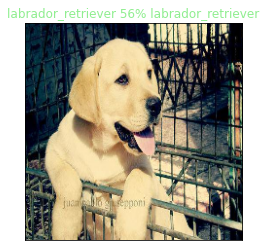

In [ ]:
plot_pred(pred_probs=predictions,
          labels=val_labels,
          images=val_images,
          n=59)

Now we've got one function to visualize our models top predictions, let's make another to view our model's top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
    * Prediction probabilities indexes
    * Prediction probabilities values
    * Prediction labels
* Plot the top 10


In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

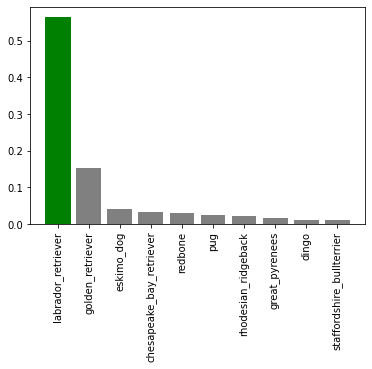

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=59)

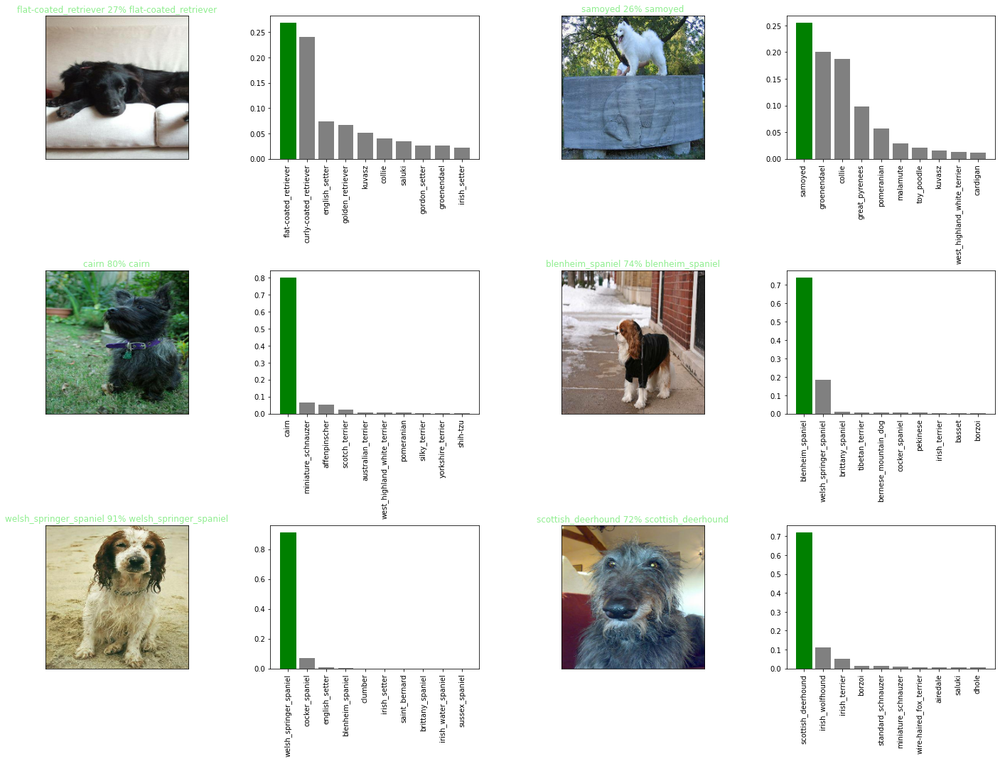

In [ ]:
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(pred_probs=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
import seaborn as sns

pred_labels = []

for i in range(len(val_labels)):
    pred_labels.append(get_pred_label(predictions[i]))

df = pd.DataFrame({"True": val_labels, "Predicted": pred_labels},
                  columns=["True", "Predicted"])

conf_mat = pd.crosstab(df["True"], 
                       df["Predicted"], 
                       rownames=["True"], 
                       colnames=["Predicted"])

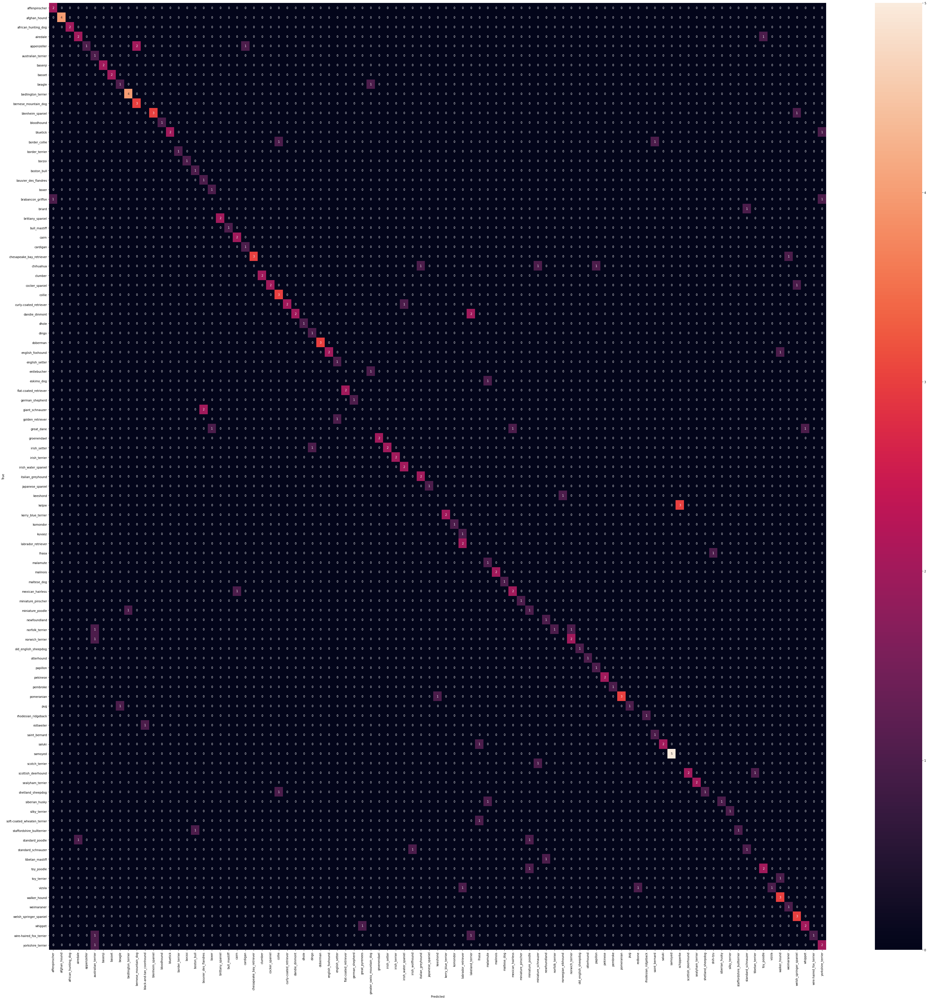

In [ ]:
plt.figure(figsize=(60, 60))
sns.heatmap(conf_mat, annot=True)
plt.show()

## 8. Save and load a model

In [ ]:
def save_model(model, suffix=None):
    """
    Saves a given model in a models directory and appends a suffix (str)
    for clarity and reuse.
    """
    # Create model directory with current time
    modeldir = os.path.join("drive/My Drive/machine-learning/dog-vision/models",
                            datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
    model_path = modeldir + "-" + suffix + ".h5" # save format of model
    print(f"Saving model to: {model_path}...")
    model.save(model_path)
    return model_path

In [12]:
def load_model(model_path):
    """
    Loads a saved model from a specified path.
    """
    print(f"Loading saved model from: {model_path}")
    model = tf.keras.models.load_model(model_path,
                                        custom_objects={"KerasLayer":hub.KerasLayer})
    return model

Now we have functions to save and load models, let's make sure they work.

In [ ]:
# Save our model
save_model(model, suffix="1000-Adam")

Saving model to: drive/My Drive/machine-learning/dog-vision/models/20200723-02471595472427-1000-Adam.h5...


'drive/My Drive/machine-learning/dog-vision/models/20200723-02471595472427-1000-Adam.h5'

In [ ]:
# Load model
loaded_1000_img_model = load_model('drive/My Drive/machine-learning/dog-vision/models/20200723-02471595472427-1000-Adam.h5')

Loading saved model from: drive/My Drive/machine-learning/dog-vision/models/20200723-02471595472427-1000-Adam.h5


## 9. Training the model on a full dataset
Now that we know the model works on a subset of data, let's train it on the full (10,000+) dataset.

In [ ]:
# Check X and y
len(X), len(y)

(10222, 10222)

We have 10,222 images and corresponding labels. 

Before we do anything, we first need to turn the data into batches.

In [ ]:
# Create a data batch
full_data = create_data_batches(X, y)
full_data

Creating training data batches...


<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create callbacks
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fit the full model to the data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 5893s 18s/step - loss: 1.3449 - accuracy: 0.6699
Epoch 2/100
320/320 [==============================] - 71s 220ms/step - loss: 0.4041 - accuracy: 0.8818
Epoch 3/100
320/320 [==============================] - 69s 217ms/step - loss: 0.2338 - accuracy: 0.9377
Epoch 4/100
320/320 [==============================] - 76s 237ms/step - loss: 0.1535 - accuracy: 0.9628
Epoch 5/100
320/320 [==============================] - 75s 234ms/step - loss: 0.1073 - accuracy: 0.9771
Epoch 6/100
320/320 [==============================] - 76s 236ms/step - loss: 0.0783 - accuracy: 0.9868
Epoch 7/100
320/320 [==============================] - 74s 230ms/step - loss: 0.0583 - accuracy: 0.9923
Epoch 8/100
320/320 [==============================] - 77s 239ms/step - loss: 0.0465 - accuracy: 0.9936
Epoch 9/100
320/320 [==============================] - 75s 234ms/step - loss: 0.0380 - accuracy: 0.9964
Epoch 10/100
320/320 [==============================] - 76s 236m

In [ ]:
save_model(full_model, suffix="full-model-all-img")

Saving model to: drive/My Drive/machine-learning/dog-vision/models/20200723-18111595527873-full-model-all-img.h5...


'drive/My Drive/machine-learning/dog-vision/models/20200723-18111595527873-full-model-all-img.h5'

## 10. Making predictions on test data
Since the model was trained on a tensor data batch, we need to make sure the test data is also in tensor batches.

* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting teh `test_data` parameters to `True`
* Make a prediction array by passing the test batches to the `preict()` method 

In [ ]:
test_filenames = [path + "test/" + fname for fname in os.listdir(path+"test")]
test_filenames[:5]

['drive/My Drive/machine-learning/dog-vision/test/f3d2b254424ab99c267abc3ab22ba627.jpg',
 'drive/My Drive/machine-learning/dog-vision/test/efb73fb00c85027773f3bef3dfc6c06b.jpg',
 'drive/My Drive/machine-learning/dog-vision/test/f282ea683674bf3bde3715cb018b1c26.jpg',
 'drive/My Drive/machine-learning/dog-vision/test/e94e14137d29b0db653e5903acac5fef.jpg',
 'drive/My Drive/machine-learning/dog-vision/test/f0311d1414f9ce10cffda4c207c108dc.jpg']

In [ ]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_predictions = full_model.predict(test_data,
                                      verbose=1)

324/324 [==============================] - 6398s 20s/step


In [ ]:
test_predictions[:10]

array([[6.2056561e-11, 4.8071964e-09, 5.7326095e-11, ..., 9.6954791e-09,
        1.3518739e-07, 2.9470204e-10],
       [5.4994243e-12, 3.2847741e-10, 6.7785916e-11, ..., 1.9520270e-10,
        4.4756865e-11, 5.1291492e-11],
       [1.8001542e-08, 4.2218260e-09, 5.2341327e-09, ..., 3.8107245e-07,
        1.6704496e-08, 1.2601912e-07],
       ...,
       [5.6330027e-12, 1.3976549e-09, 9.8319811e-11, ..., 1.5936060e-11,
        2.9179217e-10, 1.5109708e-10],
       [3.3920376e-06, 7.7785833e-12, 2.4427615e-12, ..., 2.8188556e-12,
        7.5376077e-12, 5.5028798e-10],
       [4.2013923e-08, 4.9799119e-08, 5.0980115e-10, ..., 5.8381477e-10,
        6.2411624e-11, 8.7373678e-08]], dtype=float32)

In [ ]:
# Create pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_path = path + "test"
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f3d2b254424ab99c267abc3ab22ba627,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,efb73fb00c85027773f3bef3dfc6c06b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,f282ea683674bf3bde3715cb018b1c26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e94e14137d29b0db653e5903acac5fef,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,f0311d1414f9ce10cffda4c207c108dc,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f3d2b254424ab99c267abc3ab22ba627,6.20566e-11,4.8072e-09,5.73261e-11,2.22362e-09,3.96687e-11,7.52226e-11,2.42821e-12,9.98473e-11,2.9938e-09,2.85985e-11,1.22532e-06,6.72169e-10,5.23148e-10,4.47219e-10,3.50902e-09,5.01751e-10,3.37118e-10,5.10222e-11,3.36635e-10,2.90721e-11,4.34206e-06,9.94614e-11,9.95374e-10,0.000330449,1.13778e-12,6.07202e-09,3.02375e-09,1.28276e-11,4.94937e-10,1.6655e-14,6.65746e-13,1.68898e-08,1.83719e-10,4.60548e-12,1.43299e-14,7.16278e-07,1.34067e-12,1.3039e-09,7.62689e-10,...,1.04038e-10,1.62813e-13,0.998653,3.78323e-05,2.45004e-12,3.56049e-10,3.24405e-13,1.06085e-11,7.16122e-11,1.44122e-10,3.5086e-09,1.68514e-09,2.44091e-08,1.86174e-08,6.01722e-11,1.42312e-11,1.18472e-10,3.87204e-09,1.34284e-08,2.39315e-10,9.6216e-07,1.71852e-10,6.39117e-10,0.000766772,1.59781e-12,1.15992e-09,4.42817e-09,1.78589e-11,2.87831e-07,1.44858e-05,1.44694e-09,6.55526e-13,1.76273e-11,5.95967e-10,3.46799e-09,4.07851e-12,9.55946e-11,9.69548e-09,1.35187e-07,2.94702e-10
1,efb73fb00c85027773f3bef3dfc6c06b,5.49942e-12,3.28477e-10,6.77859e-11,2.53713e-09,8.66499e-08,3.56558e-09,2.46816e-12,9.41345e-13,1.72298e-10,3.79825e-06,2.86909e-10,6.57659e-11,3.38252e-08,1.45943e-10,1.26095e-08,1.61741e-07,9.46633e-10,1.02183e-09,3.51613e-09,2.97791e-10,2.38529e-10,1.85398e-08,1.24041e-10,3.42993e-10,2.02622e-06,4.01692e-07,2.81634e-11,2.03499e-10,0.00430416,1.45163e-10,1.01226e-10,4.72569e-06,6.67543e-10,5.61328e-08,1.47412e-10,1.02625e-12,6.64268e-10,7.02847e-08,1.85223e-07,...,4.78202e-11,4.95494e-12,9.78114e-09,1.8053e-09,5.63275e-12,1.8018e-09,4.97424e-11,1.50539e-09,2.15937e-09,9.79543e-08,1.65435e-06,4.20706e-06,1.13255e-08,4.96703e-07,1.16225e-10,1.25366e-09,7.82001e-11,2.07175e-08,1.93871e-11,2.79397e-11,1.03894e-07,2.41617e-07,1.65465e-07,2.78992e-09,3.4384e-09,5.43964e-08,5.48705e-10,4.04508e-08,1.90417e-09,2.11388e-10,4.63607e-12,4.91591e-10,3.74815e-05,9.53595e-07,4.53615e-05,2.9046e-10,5.41341e-11,1.95203e-10,4.47569e-11,5.12915e-11
2,f282ea683674bf3bde3715cb018b1c26,1.80015e-08,4.22183e-09,5.23413e-09,2.59413e-09,7.00015e-05,6.82414e-06,2.01251e-10,2.66614e-10,5.9593e-10,6.87699e-08,1.42187e-09,6.79126e-11,3.17353e-07,4.29067e-08,1.42003e-06,1.79787e-06,7.95826e-08,2.08591e-06,6.05646e-06,3.08782e-08,2.06517e-08,1.10645e-09,1.66011e-07,1.18816e-07,0.000459511,2.28674e-05,3.2927e-07,3.49462e-09,0.00394876,1.40709e-07,3.75977e-09,4.91553e-06,9.00976e-07,4.54202e-07,1.1146e-08,1.58733e-10,4.64909e-09,6.65002e-07,2.72544e-07,...,3.54755e-09,2.51663e-09,1.04483e-07,5.01139e-07,1.11971e-09,3.38402e-09,1.80113e-10,7.17977e-10,1.73284e-06,3.90555e-05,0.00011916,0.000161526,2.13714e-06,0.00113104,2.13904e-09,3.64371e-09,1.07507e-08,6.22838e-07,3.27602e-10,9.58788e-10,1.95742e-06,1.46176e-06,3.60211e-07,4.32935e-05,1.37943e-07,1.15942e-07,4.22871e-09,2.50463e-07,5.06755e-09,6.34619e-08,1.93883e-09,1.16642e-08,5.47787e-07,0.00289442,0.000430235,1.27003e-08

In [ ]:
# Save as a csv
preds_df.to_csv(path + "submission/dog-vision-full-model-results.csv",
                 index=False)

In [13]:
loaded_model = load_model("drive/My Drive/machine-learning/dog-vision/models/20200723-18111595527873-full-model-all-img.h5")

Loading saved model from: drive/My Drive/machine-learning/dog-vision/models/20200723-18111595527873-full-model-all-img.h5


## 11. Making predictions on custom images

In [20]:
# Get the file paths
import os
custom_img_path = "drive/My Drive/machine-learning/dog-vision/dogs/"
img_paths = [custom_img_path + fname for fname in os.listdir(custom_img_path)]

img_paths

['drive/My Drive/machine-learning/dog-vision/dogs/husky.jpg',
 'drive/My Drive/machine-learning/dog-vision/dogs/min-poodle.jpg',
 'drive/My Drive/machine-learning/dog-vision/dogs/shih-tzu.jpg']

In [21]:
# Turn them into a batch
custom_data = create_data_batches(img_paths, test_data=True)

Creating test data batches...


In [22]:
custom_preds = loaded_model.predict(custom_data)

In [25]:
img_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
img_labels

['siberian_husky', 'miniature_poodle', 'shih-tzu']

In [27]:
import numpy as np

custom_imgs = []
for image in custom_data.unbatch().as_numpy_iterator():
    custom_imgs.append(image)

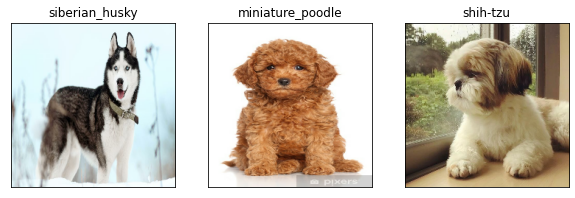

In [29]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_imgs):
    plt.subplot(1, 3, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.title(img_labels[i])
    plt.imshow(image)